#  Phase Measuring Deflectometry 

<font size="4">This Jupyter Notebook provides the whole process of phase measuring deflectometry process. The whole process can be devided into the following sections:
1. Glue aruco markers on the object and mirror used on calibration.
2. Image acquisition. This part is done via another independent program.
3. Intrinsic calibration.
4. Geometric calibration
5. Surface normal calculation.

In the following sections, details within these process will be introduced. Following the guideline, you should be able to perform a surface reconstruction smoothly

</font>

## I. Glue Aruco Markers 

<font size="4">Before you take any picture, you need to print and glue aruco markers on the mirror (used for calibration) and object you would like to reconstruct. Placing those markers in right order on right positions are crutial to high-precision reconstruction. Please read the guideline carefully and glue markers following guideline!
    
In our precedure, we assume the mirror and object are rectangular. So we recommend using rectangular mirror. If your object is not rectangular (e.g. a round-shape object), you can place the object on a rectangular board and place markers on the board.
</font>

    
reference: <a href="https://docs.google.com/presentation/d/1xE5RLV3dnNcW3E3pycHQghzJKijJvRnyj0NyMnOGcGU/edit?usp=sharing
">presentation slides</a> 

<font size="4">Marker #0 is on the upperleft side of the corner, then marker #1 on middle point of the left side, and so on. The markers are glued in the anti-clockwise order.<font size="4">
  

## II. Building Environment

<font size="4">Now we have collected the photos we need, we can perform the calibration and normal reconstruction. In order to do this, you need to be equipped with the following installed:
1. Numpy
2. OpenCV-contrib (v4.3.0 or higher)
3. Checkerboard
4. Tqdm
5. Scipy
6. Matplotlib

We recommend you to first create an anaconda environment, then install these packages. To install these packages, you can use pip or conda commands.


In [1]:
%load_ext autoreload
%autoreload 2
import os
import numpy as np
import cv2
from cv2 import aruco
import matplotlib
import matplotlib.pyplot as plt
from Calibrations import charucoMarkerCalib as cm
from Calibrations import geocalib as gc
from Calibrations import geocalibII as gc2
from Reconstructions import PMD as pmd
from Reconstructions import normal2RGB

In [2]:
# in case you meet error with PySpin import
# optional
import cv2
from cv2 import aruco
import sys
sys.path.append("C:\\Users\\18722\\AppData\\Local\\Packages\\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\\LocalCache\\local-packages\\Python38\\site-packages\\")

In [3]:
from Cameras import Webcam
from Cameras import MachineVision
from Projections import MainScreen
from Calibrations import RadiometricCalibration
from CalibrationsSessions import RadiometricCalibSession, RadiometricCalibDisplaySession

1


## III. Taking Photos

<font size="4">Then you need to take a seires of photos in order to perform the PMD procedure. This can be divided into the two step.

First, place the mirror in front of the camera. Take a photo of mirror with checkerboard pattern on display. Please make sure that all checkerboard squares are on the mirror and not occluded by the marker, like the figure above shows.

Second, keep the position of camera and screen still (NOTE: This is IMPORTANT! otherwise we need to redo step 1). Place the object in front of the camera, then run the image acquisition program to take photo of objects when sinusoidal patterns are projected.

After then, we can collect 9 photos. One photo of the mirror, and eight photos of the object.</font> 

## set up camera
choose your camera and set up

<font size="4">
    <br>1. choose an appropriate camera focus and apertureonce: <br>
       &nbsp;&nbsp; once decide, cannot change in the whole experiment <br>
    2. how to evaluate if they are appropriate? <br>
       &nbsp;&nbsp; a. object at desired position is always in focus<br>
       &nbsp;&nbsp; b. reflected pattern on the object is always in focus<br>
       &nbsp;&nbsp; c. the smaller aperture means the deeper depth of focus(recommended)<br>
       &nbsp;&nbsp; d. trade-off: smaller aperture, higher exposure time<br>
    3. take enough photos <br>
       &nbsp;&nbsp; a. around 20 images<br>
       &nbsp;&nbsp; b. change positions and angles of the board<br>
       c. the combination of boards cover the whole image and depth of view<br>
    4. how to know if a photo is good? <br>
       &nbsp;&nbsp; a. check photo pixel<br>
        &nbsp;&nbsp; b. use matlab to exclude inappropriate photo to lower reprojection error <br>
</font>

laptop webcam

In [ ]:
# internal Webcam
cam = Webcam.Internal()
# set resolution
cam.setResolutionJupyter((640, 480))
# capture image
frame = cam.getImage(name='anything', saveImage=False, saveNumpy=False)
# view camera stream
cam.viewCameraStreamJupyter()
# close camera
cam.quit_and_close()

USB webcam

In [ ]:
# external Webcam
cam = Webcam.External()
# to do

Raspberry camera

In [ ]:
# Raspberry camera
cam = Raspberry.RaspberryCam()
# to do

Basler camera

In [ ]:
# Basler
cam = MachineVision.Basler()
# to do

Flir camera

In [ ]:
# Flir initial
cam = MachineVision.Flir()
# set exposure time
exp = 3200000
cam.setExposure(exp)
# set gain
cam.setGain(0)

In [ ]:
# Flir camera caputer images
# capture one image

# Note: use the command that you want to use and mark others as comments

cam.captureImage(fname = 'test1') # This image is stored as "CapturedImages/test1.png"
cam.getImage() # This image is stored as "CapturedImages/test.png"
# capture images for calibration


# calibrationName can be 'Intrinsic', 'Geometric' etc.
# Take images for Intrinsic / Geometric Calibration 
# Note: you can do this with either command or just capture image and move its place into the folder
# images are stored in CalibrationImages/calibrationName file
cam.getImage(calibration = True, calibrationName = 'Intrinsic') 
cam.getImage(calibration = True, calibrationName = 'Geometric')


# capture sequence images with sin pattern in two directions
# the projector show patterns and camera capture images of the object
cam.captureSeqImages() # images are stored in "CapturedImages/sequenceImages" file

## set up screen
set up screen if you want.

In [ ]:
projection = MainScreen.Screen()

## IV Intrinsic Calibration

<font size="4">The next step is intrinsic calibration. In our setup, we use the built-in function of OpenCV. Detailed documents can be seen here:
https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_calib3d/py_calibration/py_calibration.html

Basically, you need a calibration checkerboard with aruco markers. Then take several images under different camera poses. You can find and print the checkerboard pdf file.

There are some tips of taking image series:
1. Make sure the checkerboard is "large enough in camera's view. The checkerboard should take at least 1/4 of camera view. The recommended portion is 1/3.
2. Place the printed checkerboard on a hard plane, e.g. a hard paper board or a gater board.
3. Try more camera poses, like rotation and translation.
4. The recommend number of images are between 10-20. In our setup, we use 16.

After acquiring these image, we can run intrinsic calibration program. Before you do it, you need to know the number of squres (on horizontal and vertical direction), size of black ckecker and size of marker (in meter). 

This program performs two functions:
1. Calculate camera intrinsic matrix and distortion coefficient.
2. Use the calculated camera parameters to undistort images you took in stage II (mirror and object photos).

So when running this program, you also need to know the input image folder (the checkerboard images), and the output imges folder (used to store undistorted mirror/object pictures).
    


In [ ]:
# Optional 
# Note: there are two methods of intrinic calibration process, one is Aruco board, the other Chessboard
# Arucoboard is optional way to do 

# intrinsic calibration with Aruco board
sqWidth = 11 # number of squares width
sqHeight = 8 # number of squares height
checkerSquareSize = 0.021 # size of the checker square in (meter)
markeSquareSize = 0.016 # size of the marker square in (meter)
imgFolder = os.path.join(os.path.join(os.getcwd(), 'CalibrationImages'), 'Intrinsic')
imgDistortFolder = os.path.join(os.path.join(os.getcwd(), 'CapturedImages'), 'sequenceImages')
# imgFolder='C:\\Users\\18722\\Downloads\\Deflectometry Code and Data\\Deflectometry Code and Data\\calibration\\calib0422'
# imgFolder = 'C:\\Users\\18722\\Downloads\\structured_light_framework-master\\structured_light_framework-master\\CalibrationImages\\Intrinsic'
# imgDistortFolder='C:\\Users\\18722\\Downloads\\structured_light_framework-master\\structured_light_framework-master\\CapturedImages\\sequenceImages'
ret, cameraMatrix, disCoeffs = cm.calibration(imgFolder, imgDistortFolder, 'calibration.npz', sqWidth, sqHeight, checkerSquareSize, markeSquareSize)

reading C:\Users\18722\Downloads\structured_light_framework-master\structured_light_framework-master\CapturedImages\sequenceImages\0.png
reading C:\Users\18722\Downloads\structured_light_framework-master\structured_light_framework-master\CapturedImages\sequenceImages\1.png
reading C:\Users\18722\Downloads\structured_light_framework-master\structured_light_framework-master\CapturedImages\sequenceImages\2.png
reading C:\Users\18722\Downloads\structured_light_framework-master\structured_light_framework-master\CapturedImages\sequenceImages\3.png
reading C:\Users\18722\Downloads\structured_light_framework-master\structured_light_framework-master\CapturedImages\sequenceImages\4.png
reading C:\Users\18722\Downloads\structured_light_framework-master\structured_light_framework-master\CapturedImages\sequenceImages\5.png
reading C:\Users\18722\Downloads\structured_light_framework-master\structured_light_framework-master\CapturedImages\sequenceImages\6.png
reading C:\Users\18722\Downloads\structur

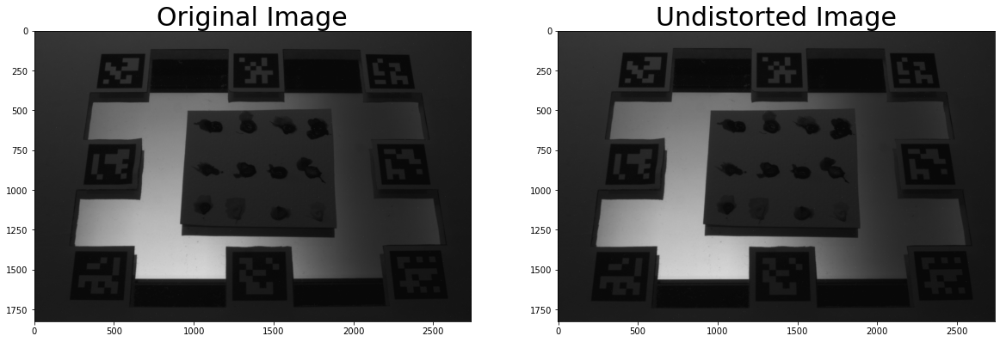

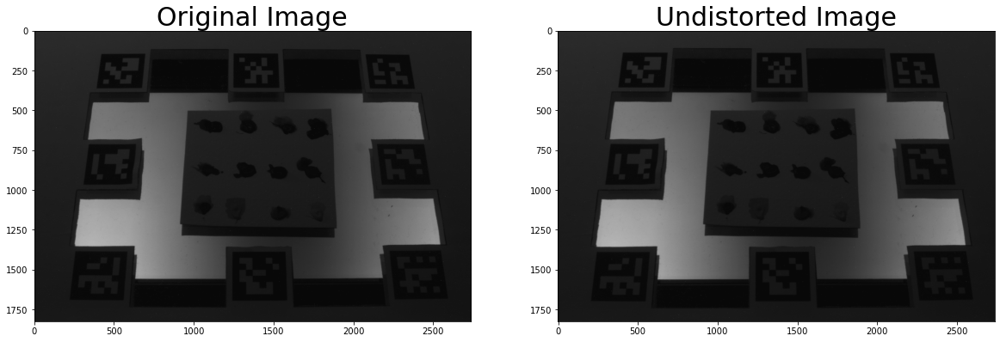

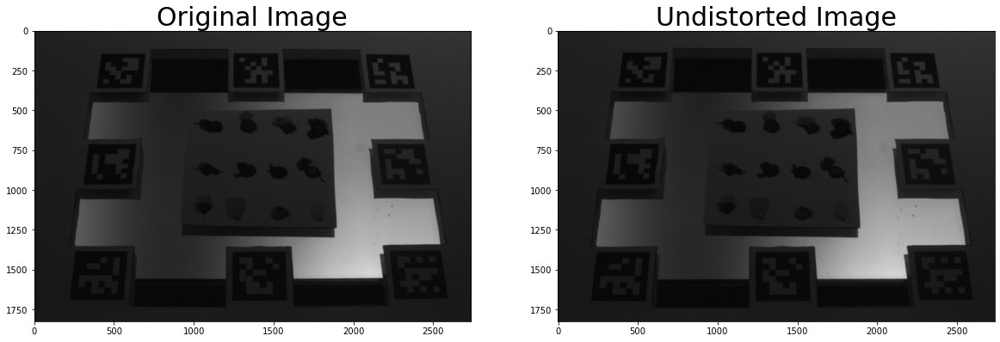

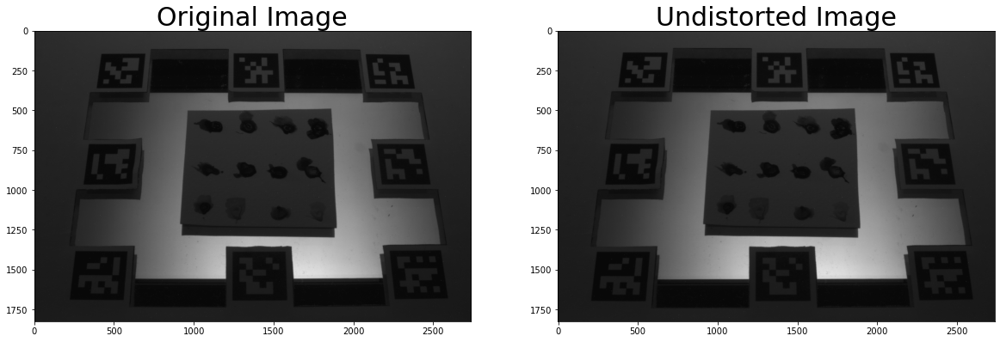

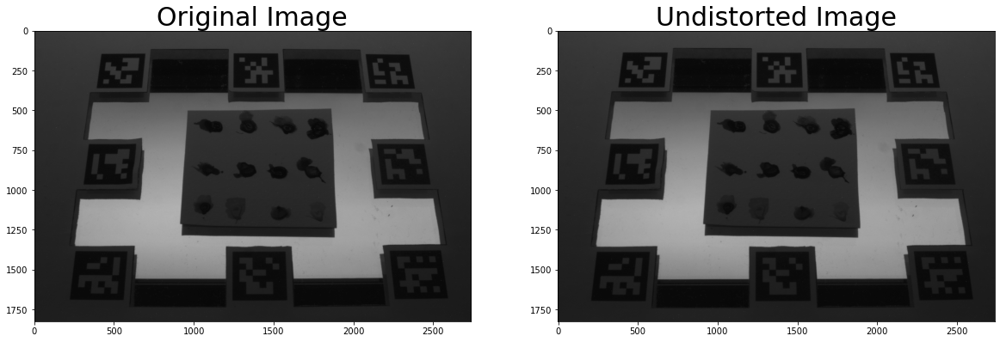

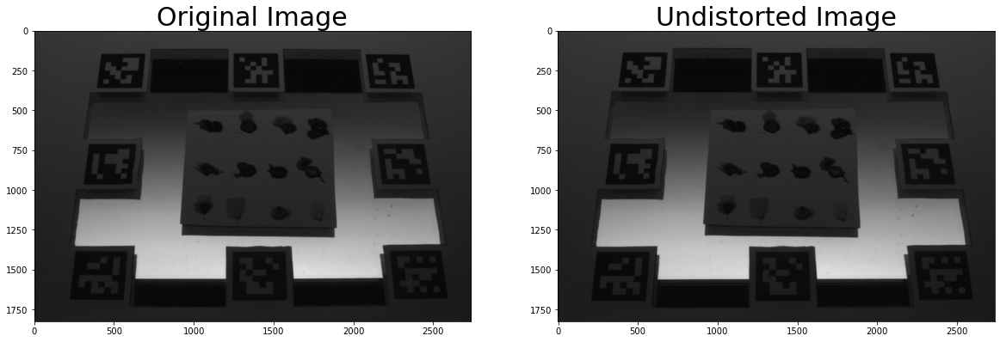

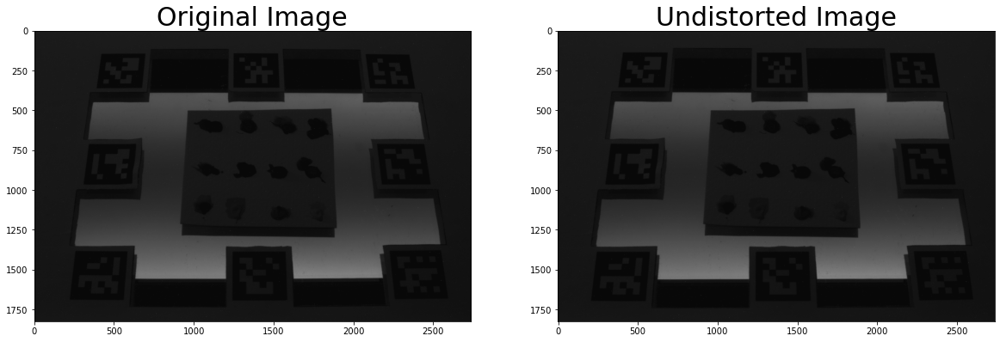

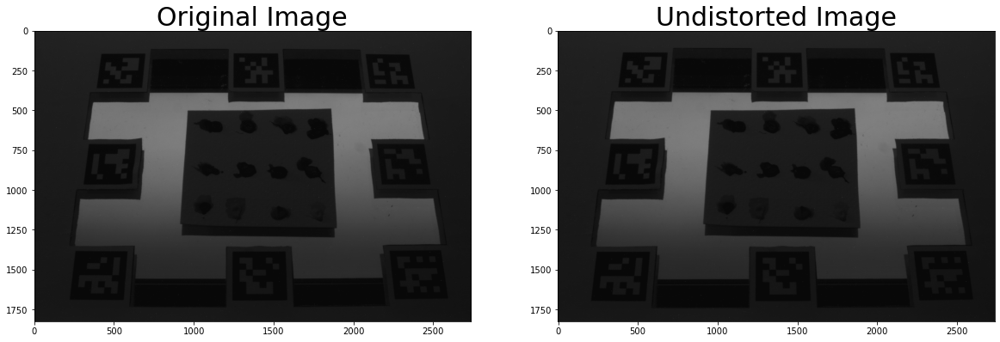

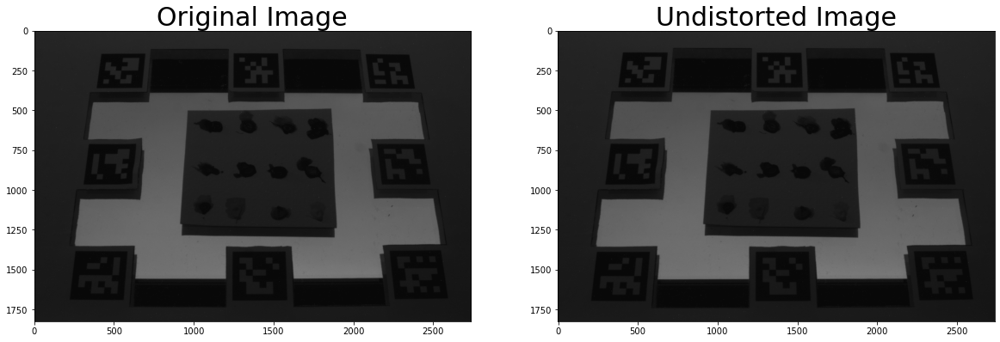

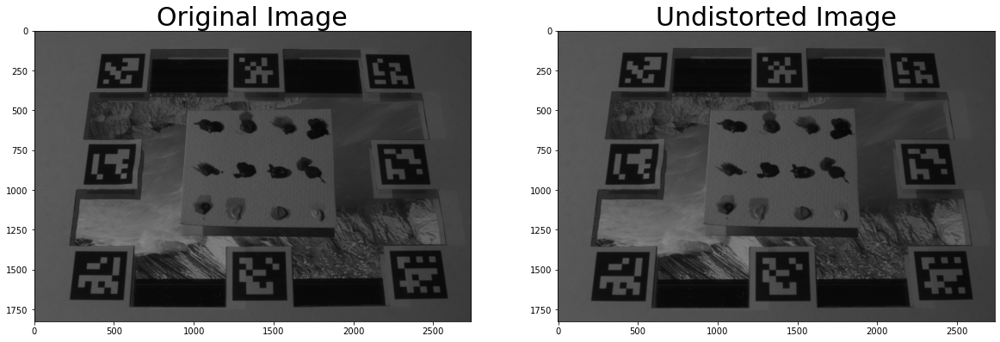

In [4]:
# intrinsic calibration with chessboard
# It is to undistort sequence images we took before
from Calibrations import intrinsicWithChessboard
checkerH = 6
checkerV = 8
size = 0.0264
imgDistortFolderPath = os.path.join(os.path.join(os.getcwd(), 'CapturedImages'), 'sequenceImages')
intrinsicWithChessboard.intrinsicWithChessboard(checkerH = checkerH, checkerV = checkerV, size = size, imgDistortFolderPath=imgDistortFolderPath)

reading C:\Users\18722\Downloads\structured_light_framework-master\structured_light_framework-master\CalibrationImages\Geometric\test.png


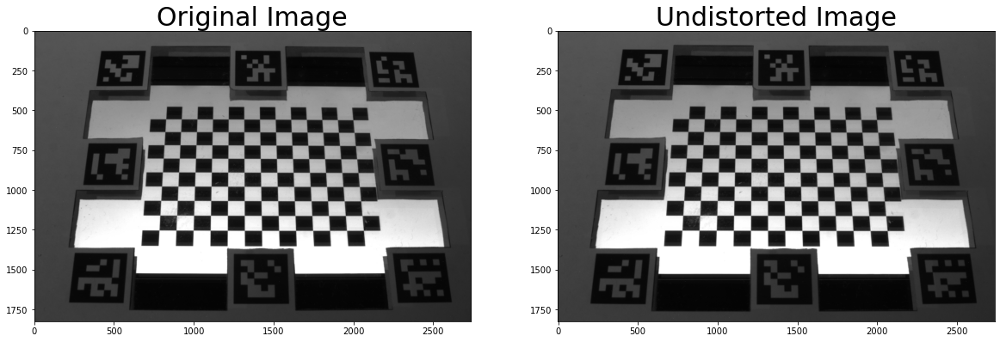

In [5]:
# use intrinsic calibration result to process image for geometric calibration
# It is to undistort images for geometric calibration 
from Calibrations import intrinsicWithChessboard
checkerH = 6
checkerV = 8
size = 0.0264
imgDistortFolderPath = os.path.join(os.path.join(os.getcwd(), 'CalibrationImages'), 'Geometric')
ret, cameraMatrix, disCoeffs, rvecs, tvecs = intrinsicWithChessboard.intrinsicWithChessboard(checkerH = checkerH, checkerV = checkerV, size = size, imgDistortFolderPath=imgDistortFolderPath)

<font size="4">After intrinsic calibration, you need to do geometric calibration. The purpose of geometric calibration is to calculate pose, i.e. rotation and translation between object, camera and display. 

When doing geometric calibration, you need the image of the mirror, with reflected checkerboard from display (both original and undistorted). Also, you need to know the dimension of the mirror and the size of checkersquare on the screen. After the geometric calibration program, you can see the visualized mirror, camera and display in a world coordinate system. If everything works on well, you should see them placed at similar positions as they are placed in the real-world.

In [ ]:
# Optional
# undistort images, which will be used in geometric calibation, with result from intrinsic calibration with Aruco board
# Aruco board is optional
imgFolder = os.path.join(os.path.join(os.getcwd(), 'CalibrationImages'), 'Intrinsic')
imgDistortFolder = os.path.join(os.path.join(os.getcwd(), 'CalibrationImages'), 'Geometric')
ret, cameraMatrix, disCoeffs = cm.calibration(imgFolder, imgDistortFolder, 'calibration.npz', sqWidth, sqHeight, checkerSquareSize, markeSquareSize)
# undistorted image is saved in undistort file as 0.png

reProjAruco


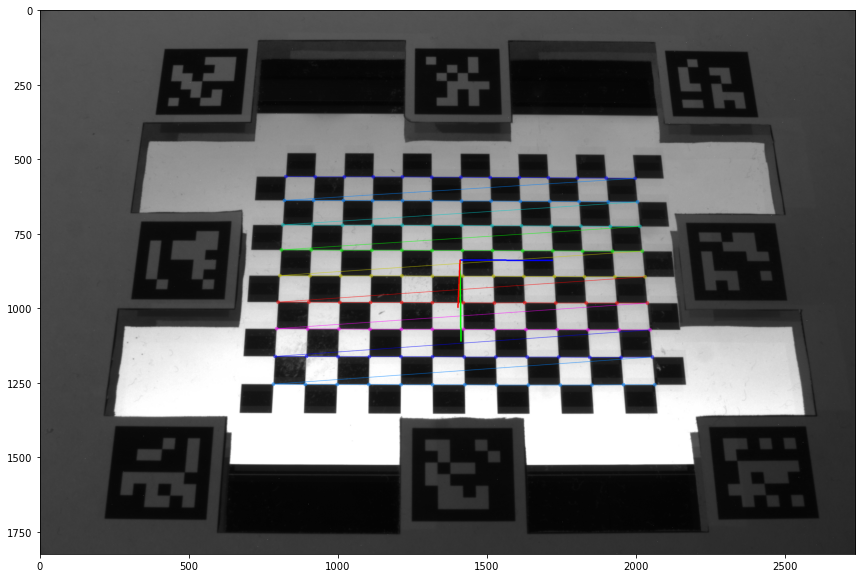

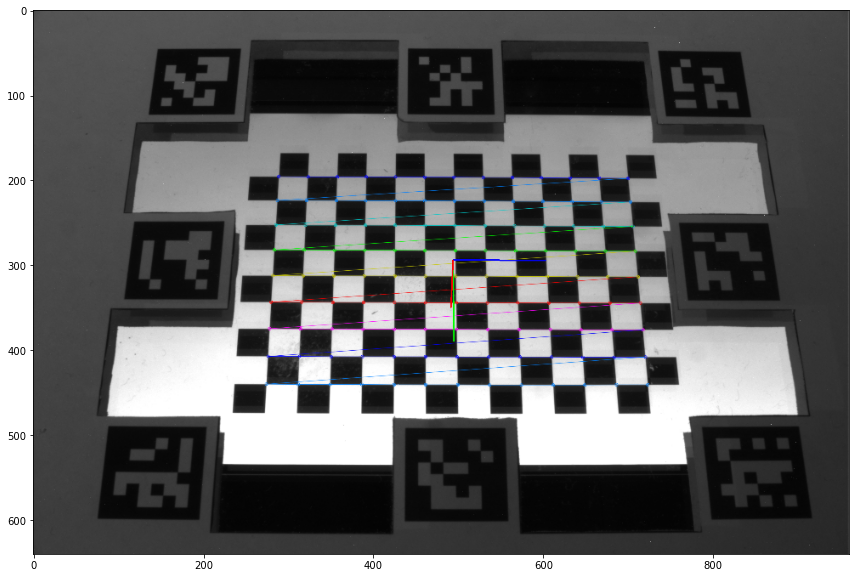

[[0.00849622]
 [0.00841418]
 [0.67983348]]
rC2S: [[-0.99994172  0.00367642 -0.01015041]
 [ 0.00858858  0.84057198 -0.54163178]
 [-0.00654088  0.5416874   0.84055457]]
tC2S: [0.01960153 0.35910059 0.05341523]


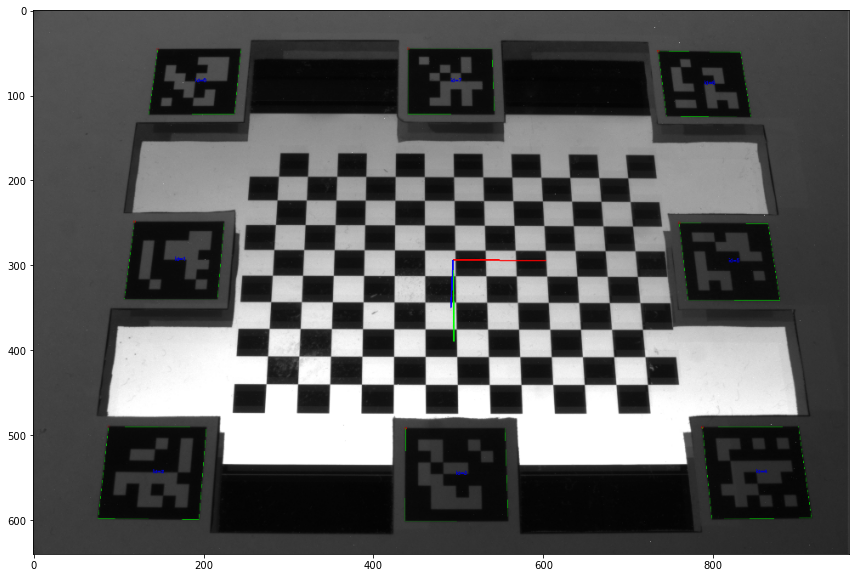

cam z axis in world coor is  [ 0.01427343 -0.539037    0.84216114]
cam zero point in world coor is  [-0.00762627  0.1673687  -0.26226612]
display z axis in world coor is  [0.00673969 0.00311584 0.99997243]
display zero in world coor is  [ 0.01059254 -0.19195131 -0.314686  ]


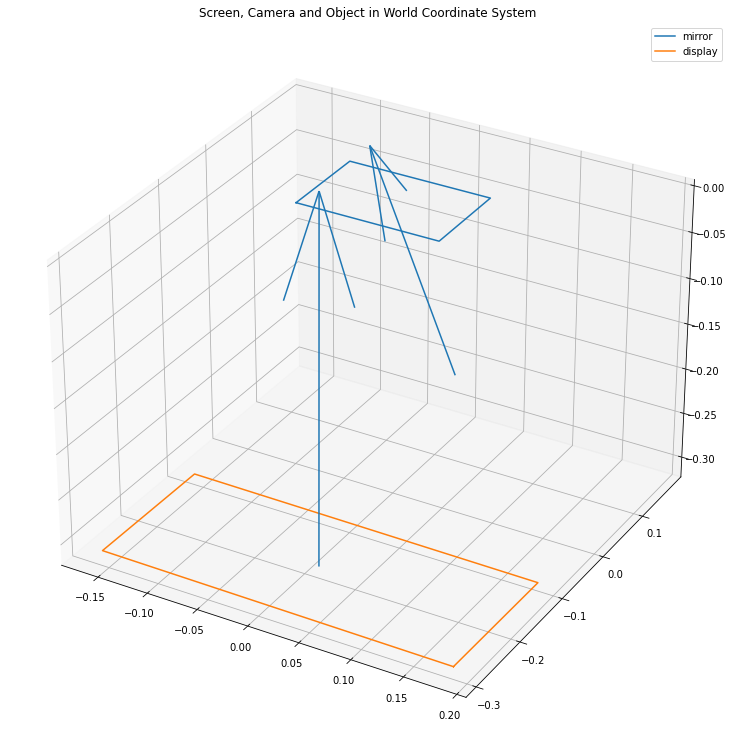

In [6]:
# exposure time: 18000000
# geometric calibration part 1
# half length and width of mirror, -0.005 represents that the outer corner of marker is 5mm blank edge, which needs to be distracted.
half_length = 0.14 / 2
half_height = 0.12 / 2
marker_size = 0.02
# display scale factor, which is the ratio of single checker square length between metric and pixel unit.
# for example, if the length of a checke square on display in 65mm, and it takes 60 pixel in screen, so the ratio is 0.065/60.
# displayScaleFactor = 0.15/ (23*15) #0.0011
# 140 mm
displayScaleFactor = 0.115/(80 * 8)
#geoCalibImgFile = "C:\\Users\\18722\\Downloads\\Deflectometry Code and Data\\Deflectometry Code and Data\\pyspin0316\\mirror0419\\test\\test.png"
# location of undistorted image
#geoCalibImgUndistortFile = "C:\\Users\\18722\\Downloads\\Deflectometry Code and Data\\Deflectometry Code and Data\\pyspin0316\\mirror0419\\test\\0.png"

# location of raw distorted image
geoCalibImgFile = os.path.join(os.path.join(os.path.join(os.getcwd(), 'CalibrationImages'), 'Geometric'), 'test.png')
# location of undistorted image
geoCalibImgUndistortFile = os.path.join(os.path.join(os.path.join(os.path.join(os.getcwd(), 'CalibrationImages'), 'Geometric'), 'undistort'),'0.png')
displayintersect, camdisintersect, rc2s, tc2s = gc.geoCalib(geoCalibImgFile, geoCalibImgUndistortFile, half_length, half_height, marker_size, cameraMatrix, disCoeffs, ret, displayScaleFactor)
# result images are saved in geoCalibResults file

<font size="4">Then, you can run a verification program to check the precision of geometric calibration. In this program, we will use the calculated rotation and translation between mirror, camera and screen to "project" checker pattern on the screen back to image coordinate system. Then, you can compare the reprojected checker pattern and the actual checker pattern in the image. For a high-presicion geometric calibration, two patterns should be coincide (or nearly coincide) in the image. To help you compare difference between two patterns, the program shows the picture with two patterns overlaid.</font> 

<Figure size 1080x720 with 0 Axes>

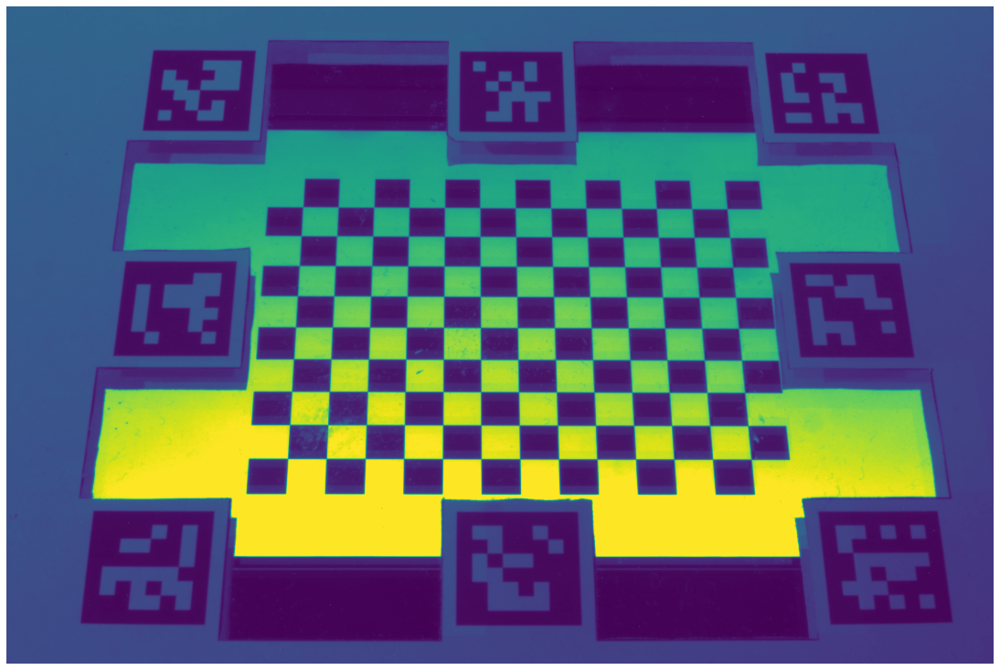

(1824, 2736)


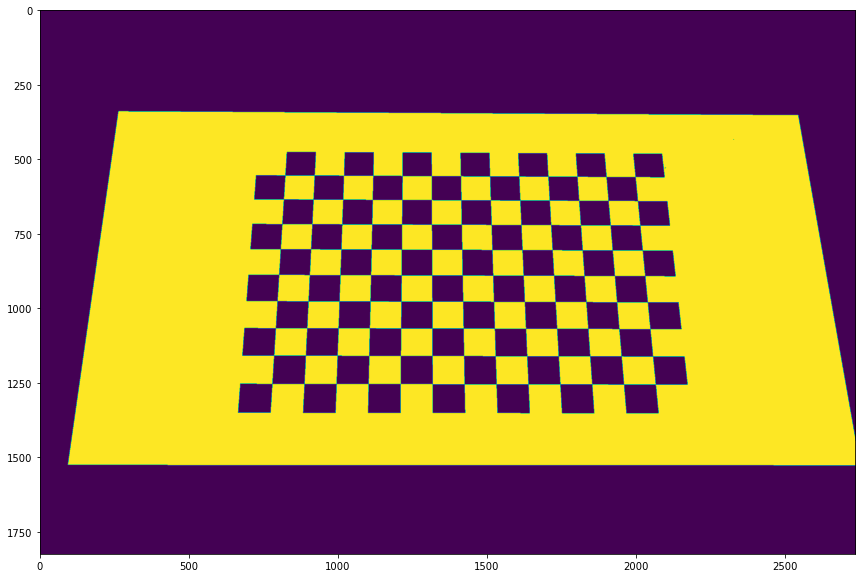

<Figure size 1080x720 with 0 Axes>

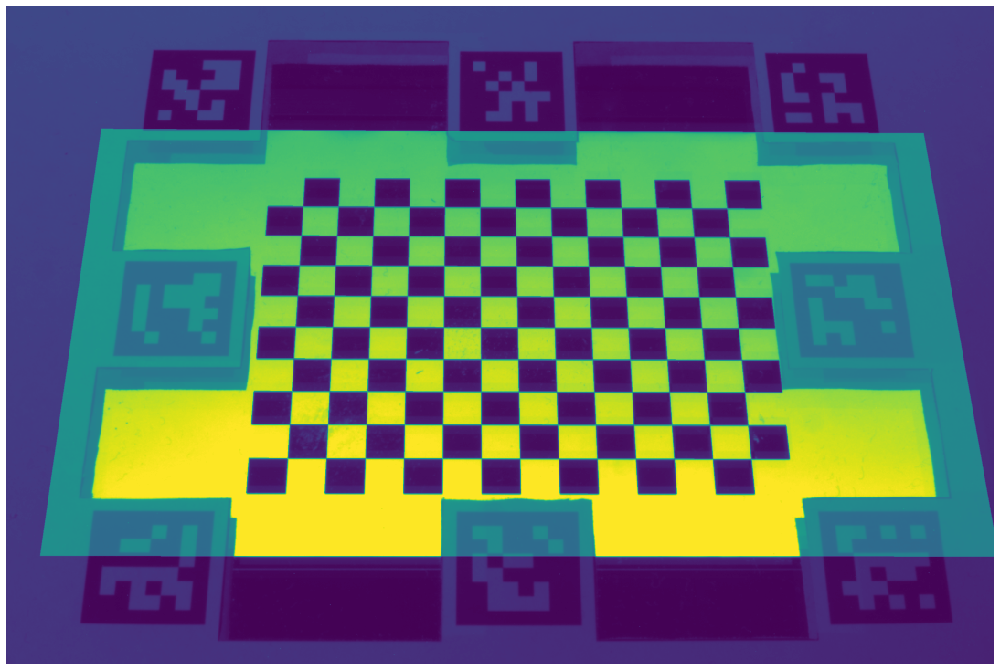

In [7]:
# geometric calibration validation
gc2.geoCalibII(geoCalibImgUndistortFile, displayintersect, displayScaleFactor)

## VI. Radiometric Calibration

setp 1: Camera calibration

setp 2: Display calibration

step 3: calculate and undistort images

Library version: 2.3.0.77

Unable to set acquisition Frame Rate (enum retrieval). Aborting...
0
Automatic exposure disabled...
Automatic gain disabled...
Exposure: 120000.0
Gain: 0.0
1


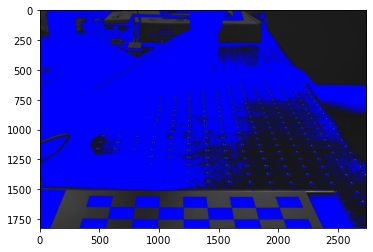

In [11]:
# tool to check image pixels beyond thresholds
import checkImageWithThreshold
checkImageWithThreshold.checkImageWithThreshold(exposure=120000, lower_bound=20, upper_bound=255)

In [ ]:
# camera calibration

# Set up the calibration object
radio_calib = RadiometricCalibration.RadiometricCalibration(cam.getResolution())

# Set up the calibration session by passing on the camera and the calibration object
# To set your own exposures please pass them to the RadiometricCalibSession when creating
radio_calib_session = RadiometricCalibSession.RadiometricCalibSession(cam, radio_calib)

# Capture images with different exposures
radio_calib_session.capture()

# calculation curve function
g, g_n = radio_calib_session.calibrate_HDR(smoothness=500)

# if data is stored
radio_calib.load_calibration_data()
radio_calib.plotCurve('Grayscale')

In [ ]:
# display calibration
# initial 
radio_calib_display = RadiometricCalibDisplaySession.RadiometricCalibDisplaySession(cam, radio_calib)

# capture images of display of different pixels
radio_calib_display.captureImages()

# calculate reflectivity 
radio_calib_display.calculateReflectivity()
# result images: Display to Relative Radiance Curve, Display Value to Average Pixel Value Curve

In [ ]:
# just to undistort images 
radio_calib = RadiometricCalibration.RadiometricCalibration(cam.getResolution())
radio_calib_display = RadiometricCalibDisplaySession.RadiometricCalibDisplaySession(cam, radio_calib, exposure=exp)
radio_calib_display.radiometricCalibUndistortImages()
# undistorted images are saved in 'CapturedImagessequenceImages/undistortRadioCalib'

## VII. Normal Calculation

### Example 1 - Scan pigment

C:\Users\18722\Downloads\structured_light_framework-master\structured_light_framework-master\CapturedImages\sequenceImages\undistortRadioCalib\*.png
(4, 1824, 2736)


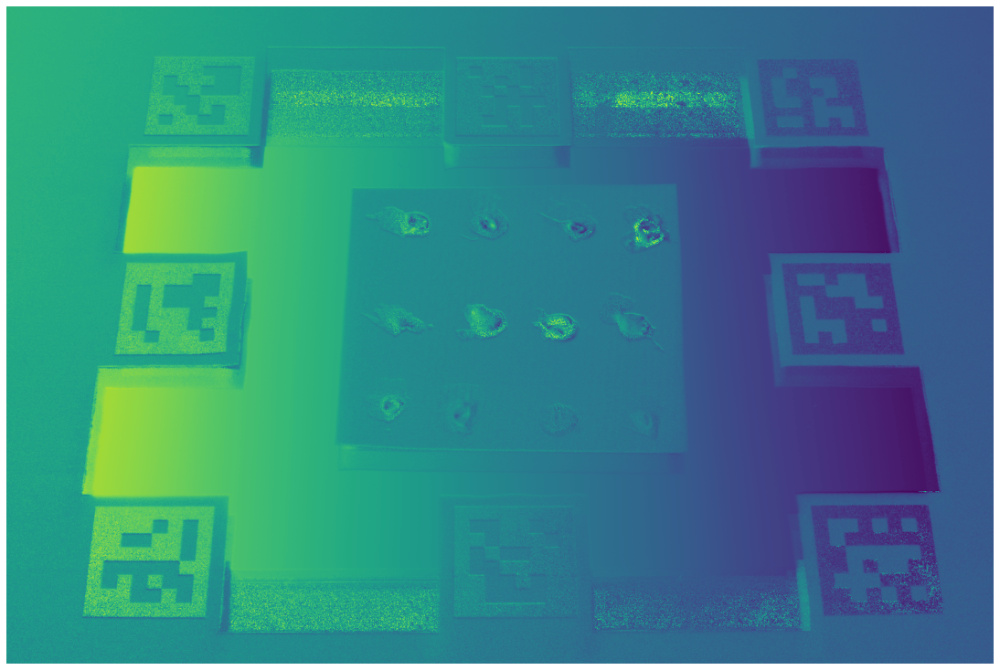

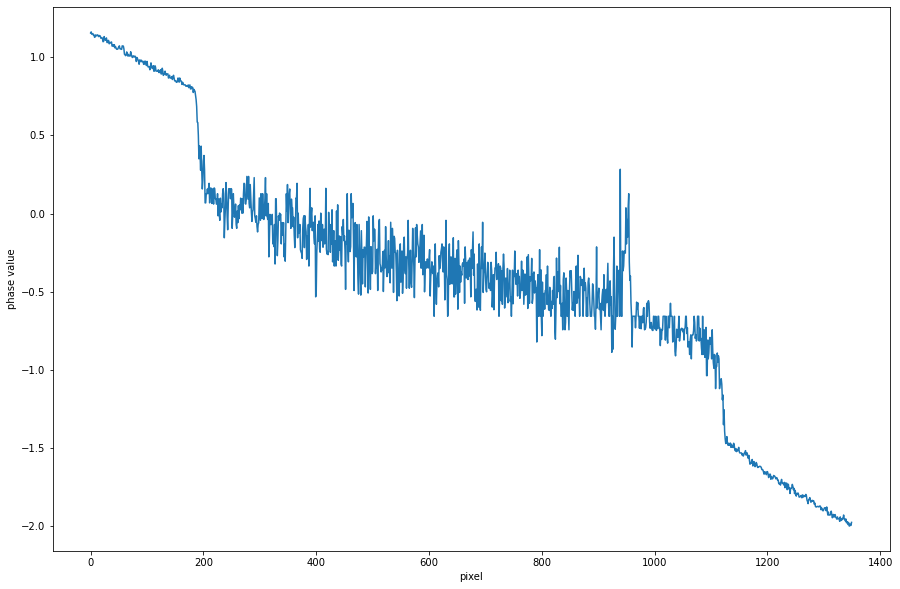

<Figure size 1080x720 with 0 Axes>

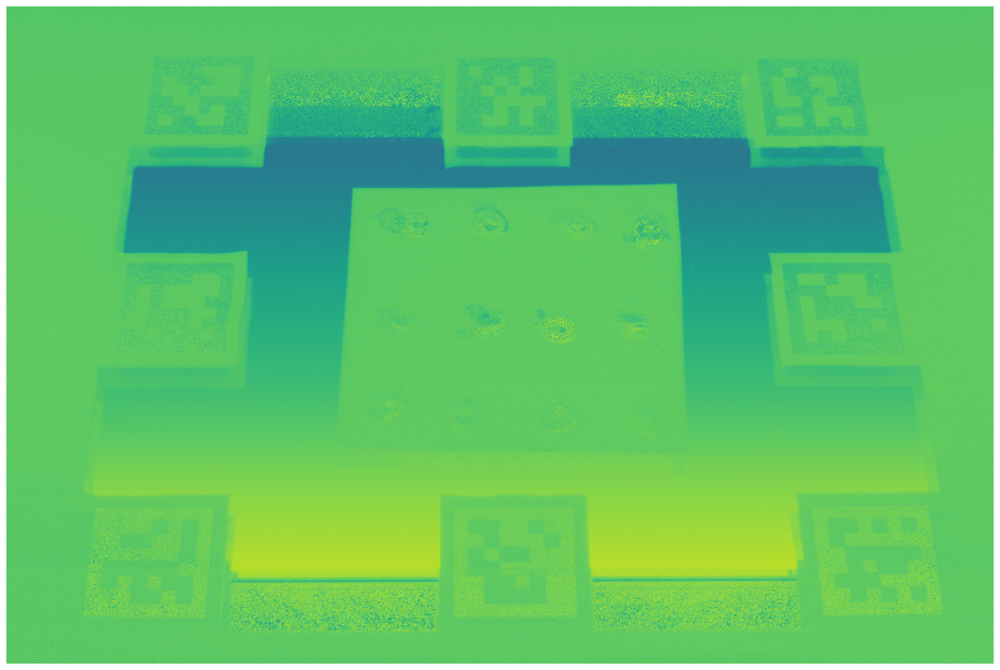

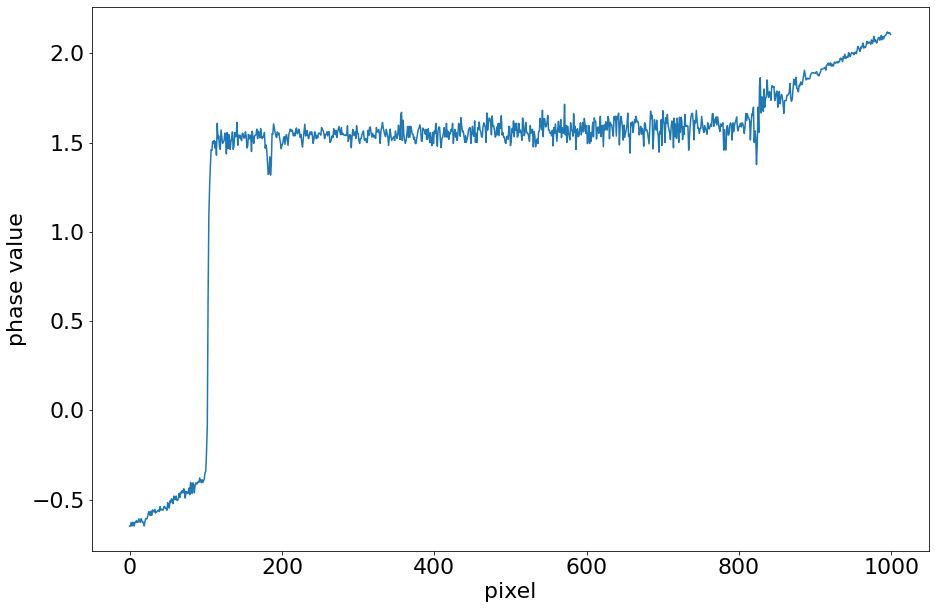

[[[ 2.57873841e+00  6.56343279e-03  5.07002796e-02]]

 [[ 2.51710877e+00 -1.00065782e-02 -7.25080387e-04]]

 [[ 2.52469746e+00  2.00062832e-02 -2.52708386e-04]]

 [[ 2.52913793e+00 -2.02578383e-02  1.56875769e-03]]

 [[ 2.52207734e+00  2.41419453e-03  3.18766411e-02]]

 [[ 2.53672256e+00 -1.51041458e-02  2.04095722e-02]]

 [[ 2.55347255e+00 -4.68085449e-03  2.22053302e-02]]

 [[ 2.58422613e+00 -1.47416026e-02 -1.26232843e-02]]]


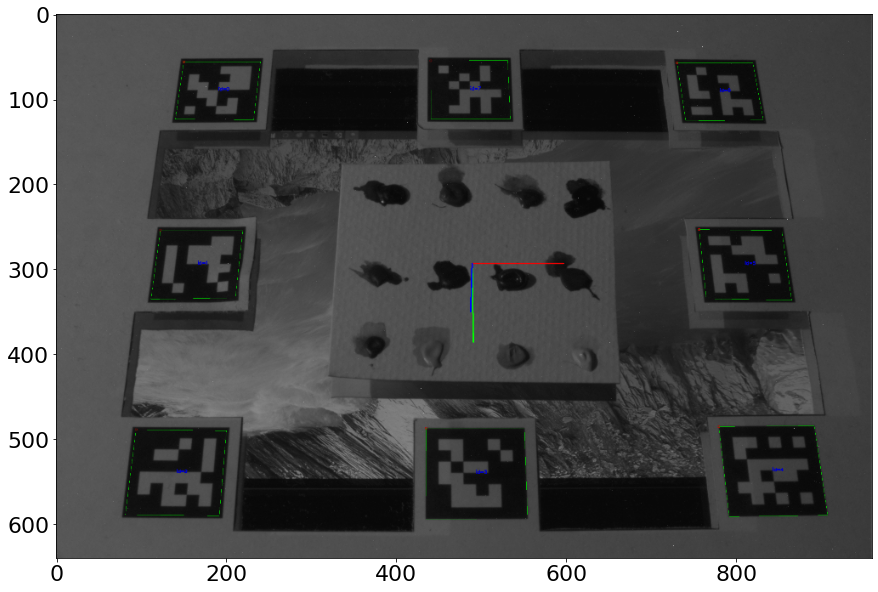

normal map generated.
0.1399999849688786
0.11999999492718422


In [8]:
# final PMD surface reconstruction part. This will generate normal file.
sinusoidImgPath = os.path.join(os.path.join(os.path.join(os.getcwd(), 'CapturedImages'), 'sequenceImages'), 'undistortRadioCalib')
# sinusoidImgPath = os.path.join(os.path.join(os.path.join(os.getcwd(), 'CapturedImages'), 'sequenceImages'), 'undistort')
addImgPath = os.path.join(os.path.join(os.path.join(os.getcwd(), 'CapturedImages'), 'sequenceImages'), '9.png')
normalFolder = os.path.join(os.path.join(os.path.join(os.getcwd(), 'CapturedImages'), 'sequenceImages'), 'results')
# half length and half height of reconstructed object. Also need to substract 0.005
half_length_obj = 0.07
half_height_obj = 0.06
marker_size = 0.02
normalImage, normal_mat_origin, normalmap_world = pmd.PhaseMeasuringDeflectometry(rawImgPath=sinusoidImgPath, addImgPath= addImgPath, normalPath= normalFolder, metric_factor= displayScaleFactor, cameraMatrix= cameraMatrix, disCoeffs= disCoeffs, ret= ret, rc2s= rc2s, tc2s= tc2s, half_length= half_length_obj, half_height= half_height_obj, marker_size= marker_size)
# result images are saved in 'CapturedImagessequenceImages/results'

<font size= "4">Now you can visualize the normal map you calculated!
There're three different normal maps generated from previous step. They are:
1. Normal map encoded into an RGB image (x, y, z components of the normal vector represents R, G and B value of each pixel).
2. Normal map under camera perspective
3. Normal map under world perspective </font>

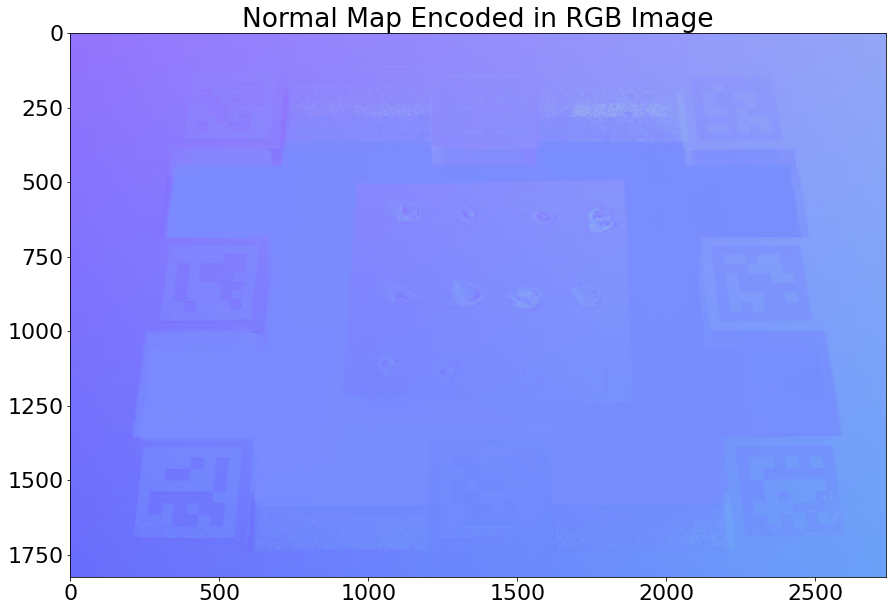

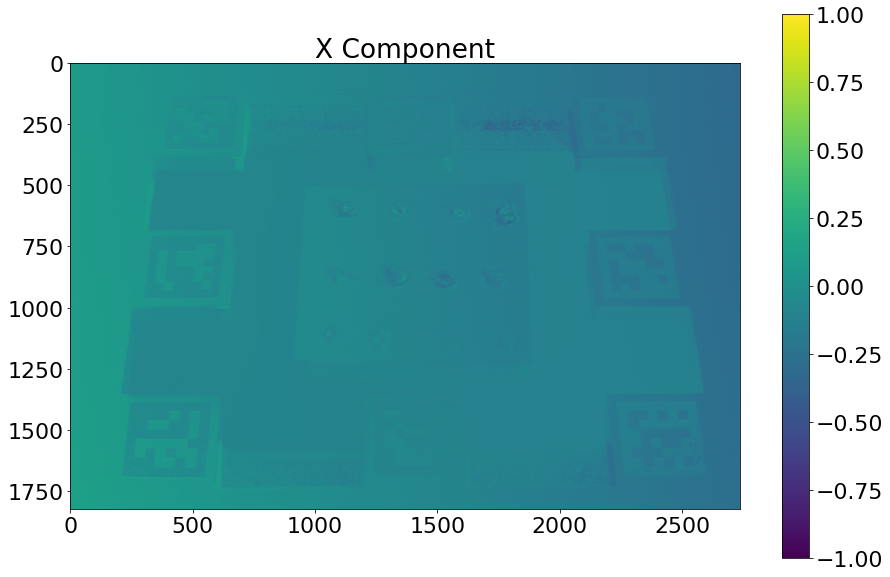

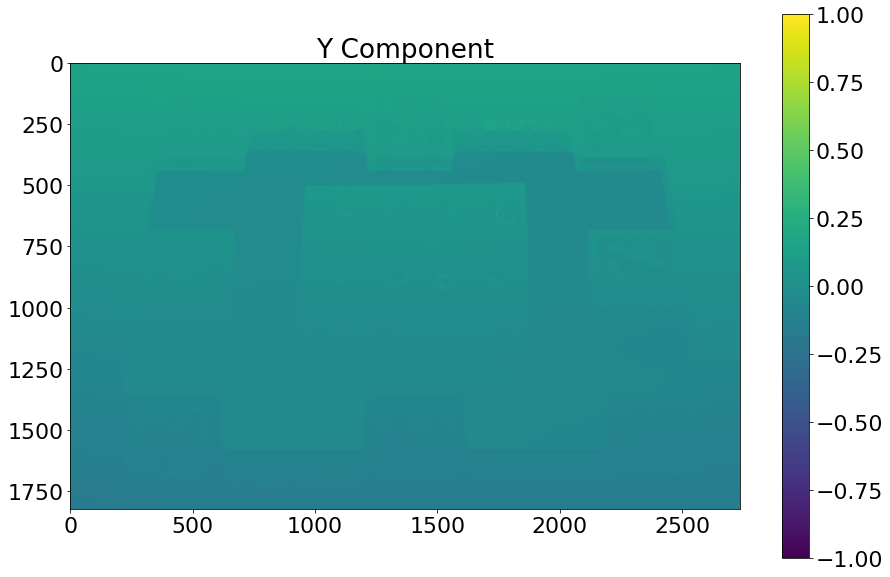

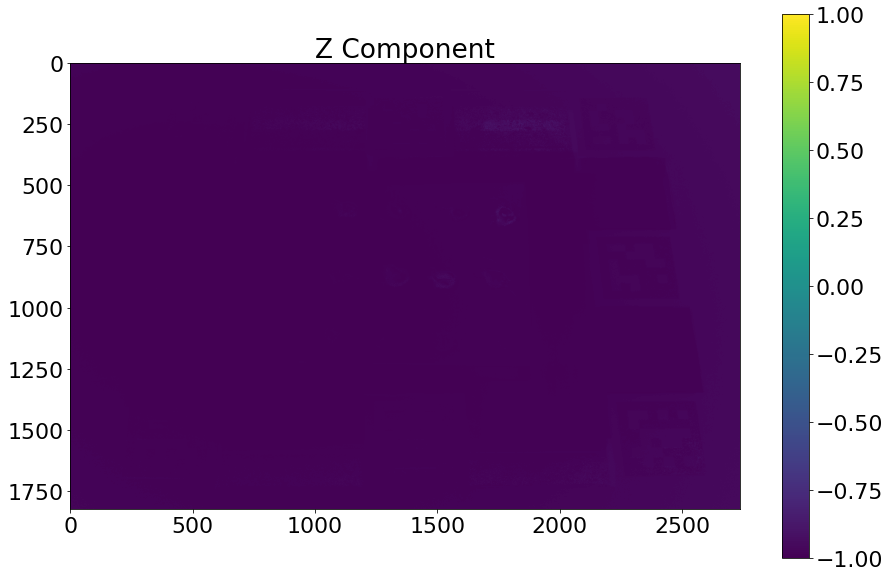

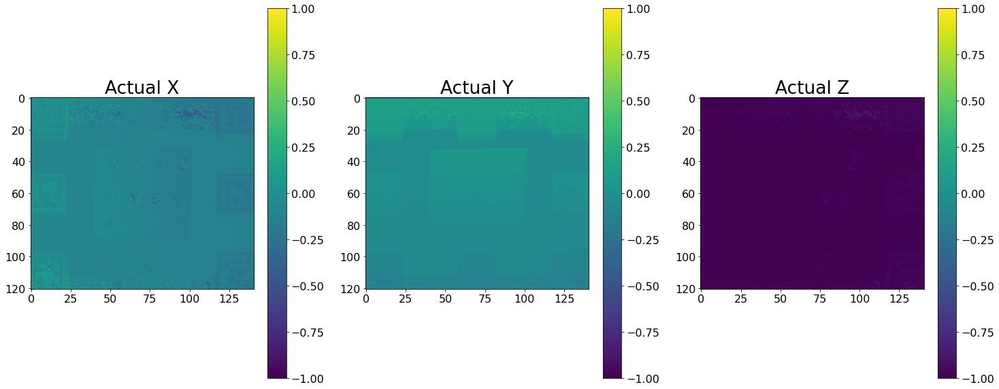

In [9]:
normal2RGB.normal2RGB(normalImage, normal_mat_origin, normalmap_world)
# result images are saved in 'CapturedImagessequenceImages/results'

### Example 2 - Scan mirror

C:\Users\18722\Downloads\structured_light_framework-master\structured_light_framework-master\CapturedImages\sequenceImages-mirror\undistortRadioCalib\*.png
(4, 1824, 2736)


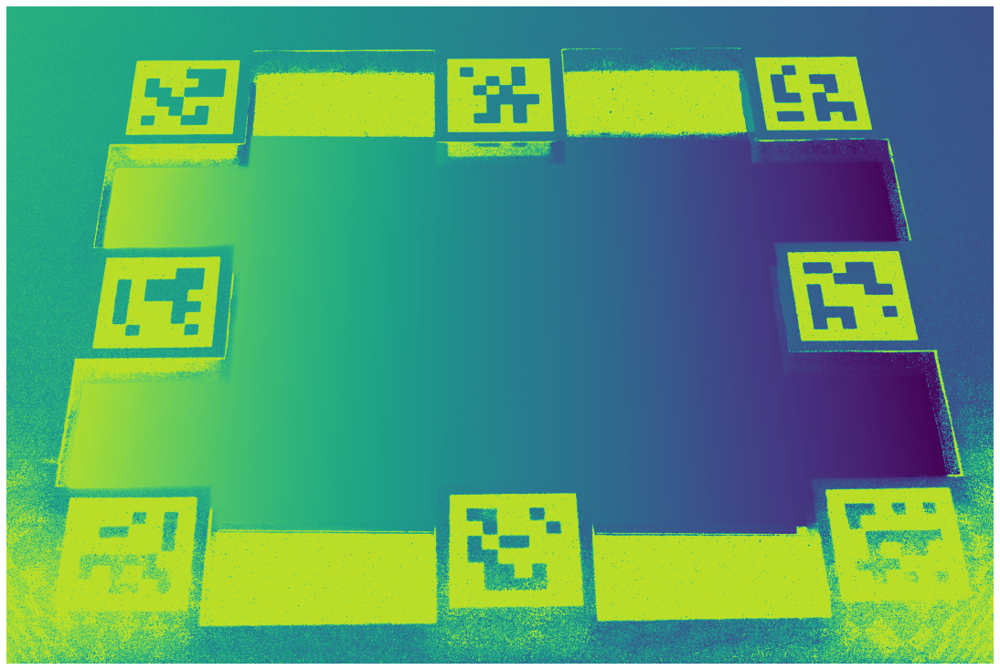

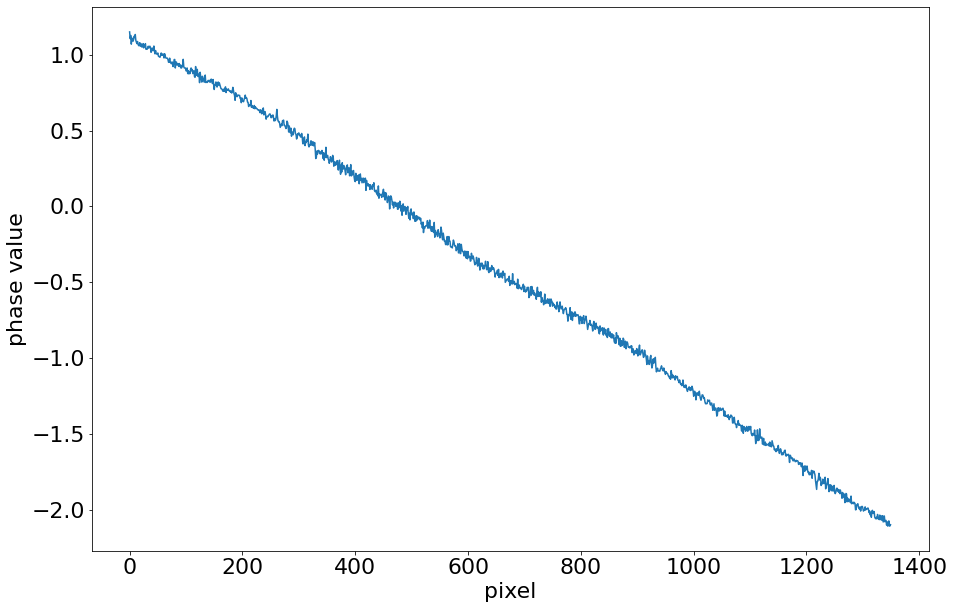

<Figure size 1080x720 with 0 Axes>

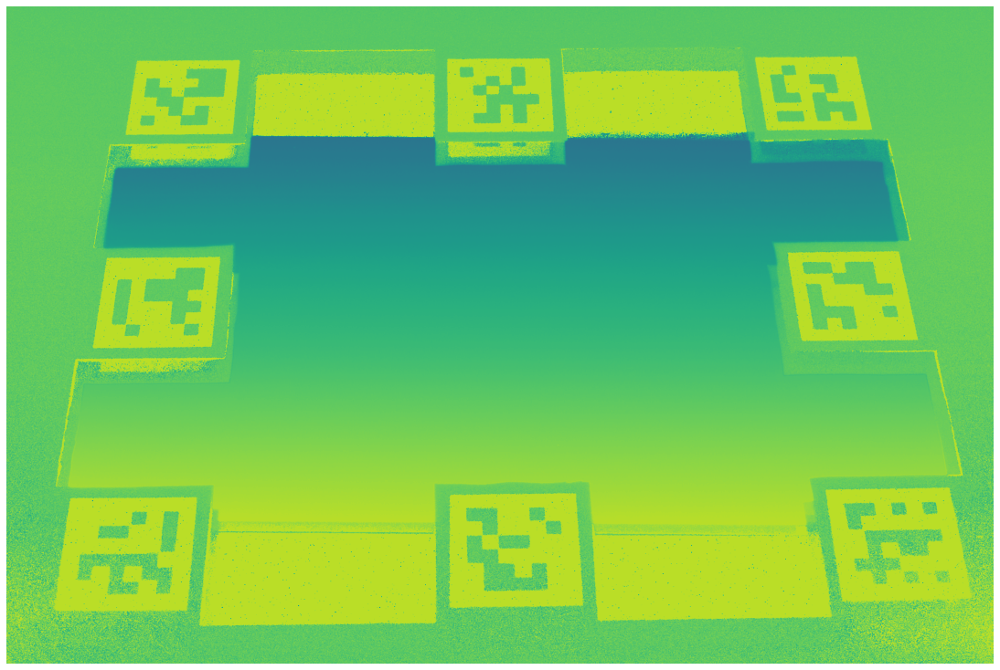

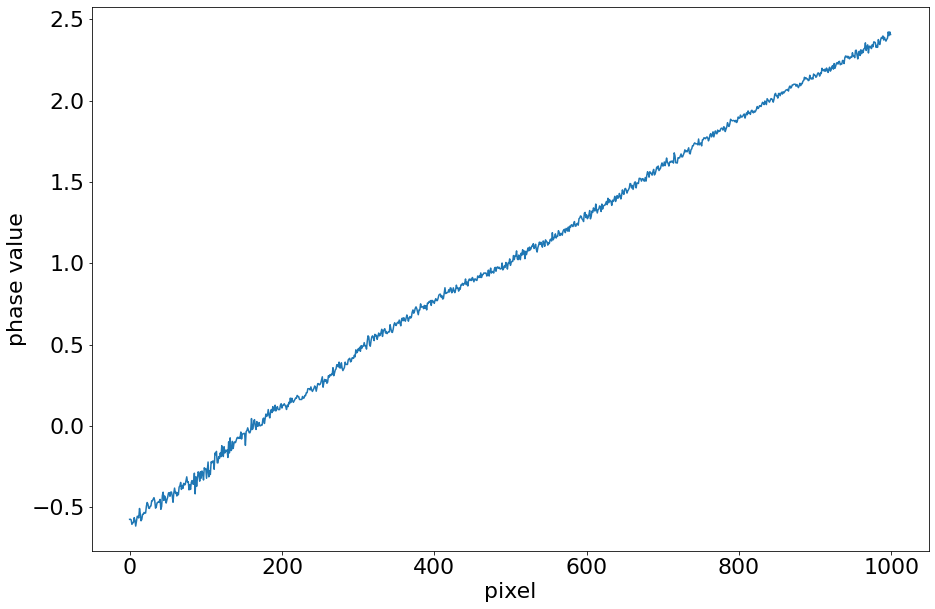

[[[ 2.46457984 -0.01973456  0.02514636]]

 [[ 2.47028212 -0.02016759  0.02313915]]

 [[ 2.4639922  -0.02149249  0.02602726]]

 [[ 2.46614095 -0.01802086  0.02626304]]

 [[ 2.49033269 -0.01641567  0.05847348]]

 [[ 2.47292139 -0.01964273  0.02668822]]

 [[ 2.49493951 -0.03265276 -0.00980865]]

 [[ 2.46889029 -0.01651106  0.02014787]]]


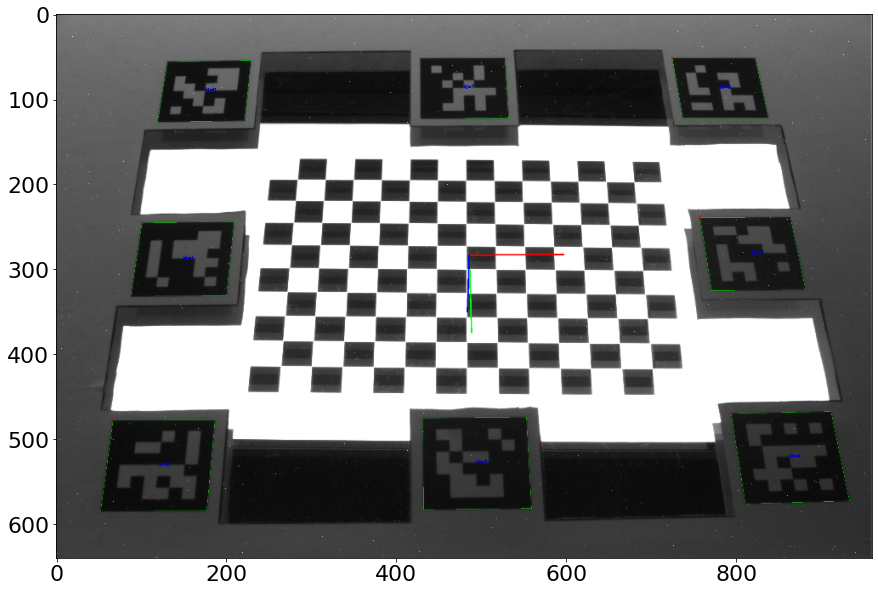

normal map generated.
0.13999999710413213
0.11999999778245349


In [10]:
# final PMD surface reconstruction part. This will generate normal file.
sinusoidImgPath = os.path.join(os.path.join(os.path.join(os.getcwd(), 'CapturedImages'), 'sequenceImages-mirror'), 'undistortRadioCalib')
# sinusoidImgPath = os.path.join(os.path.join(os.path.join(os.getcwd(), 'CapturedImages'), 'sequenceImages'), 'undistort')
addImgPath = os.path.join(os.path.join(os.path.join(os.getcwd(), 'CapturedImages'), 'sequenceImages-mirror'), 'test.png')
normalFolder = os.path.join(os.path.join(os.path.join(os.getcwd(), 'CapturedImages'), 'sequenceImages-mirror'), 'results')
# half length and half height of reconstructed object. Also need to substract 0.005
half_length_obj = 0.07
half_height_obj = 0.06
marker_size = 0.02
normalImage, normal_mat_origin, normalmap_world = pmd.PhaseMeasuringDeflectometry(rawImgPath=sinusoidImgPath, addImgPath= addImgPath, normalPath= normalFolder, metric_factor= displayScaleFactor, cameraMatrix= cameraMatrix, disCoeffs= disCoeffs, ret= ret, rc2s= rc2s, tc2s= tc2s, half_length= half_length_obj, half_height= half_height_obj, marker_size= marker_size)
# result images are saved in 'CapturedImagessequenceImages/results'

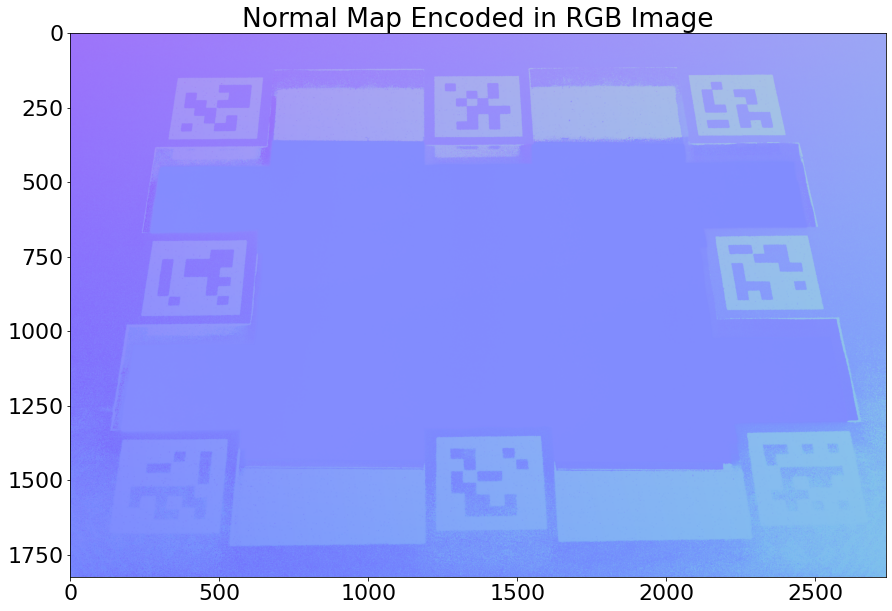

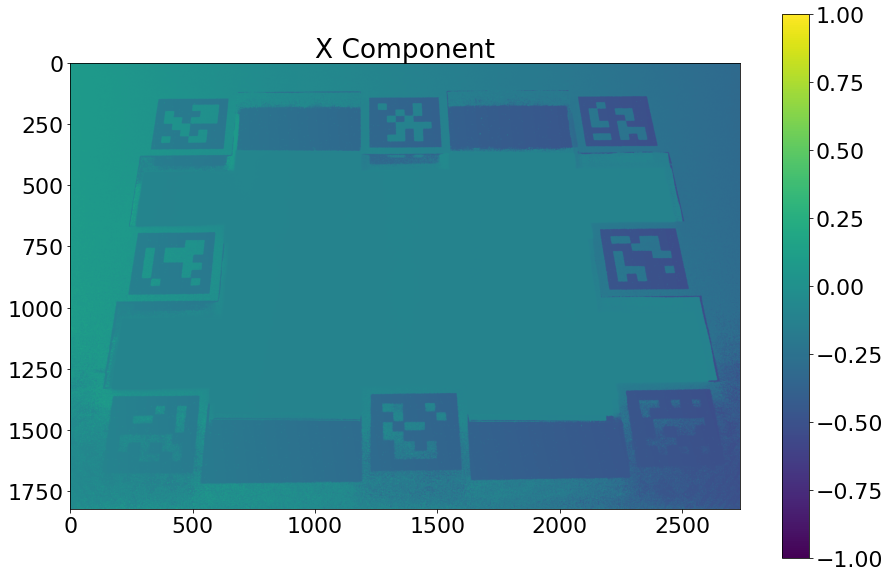

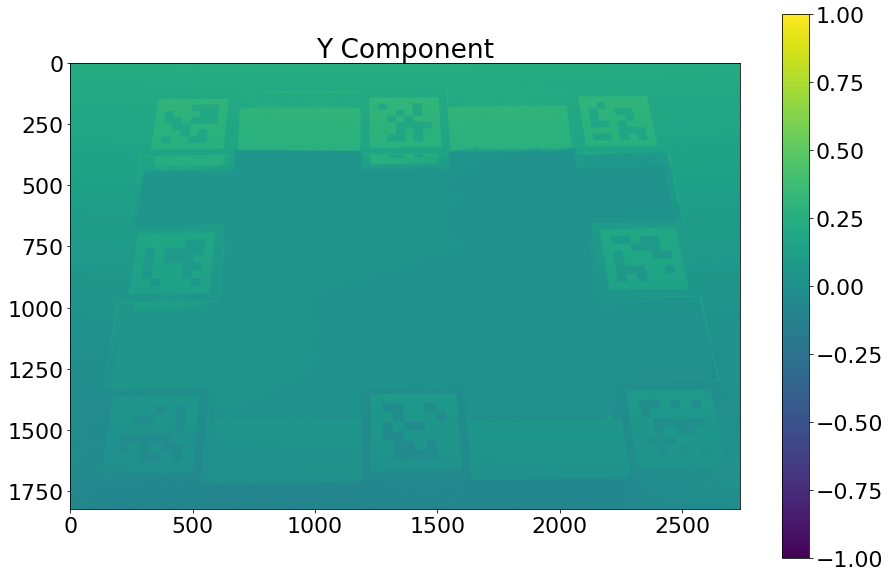

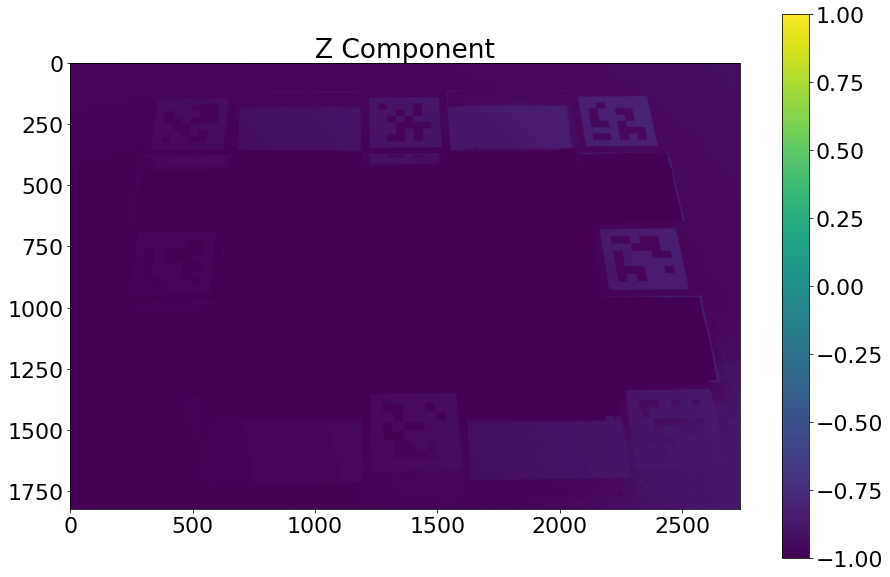

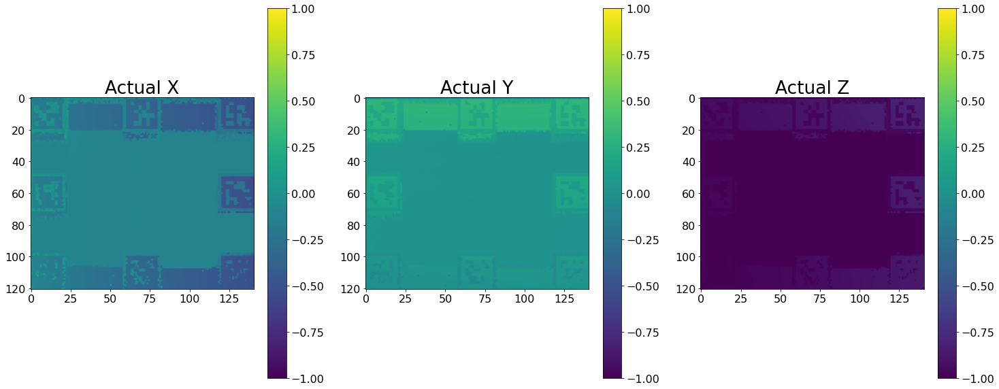

In [11]:
normal2RGB.normal2RGB(normalImage, normal_mat_origin, normalmap_world)
# result images are saved in 'CapturedImagessequenceImages/results'